# Earthquake
Start of a project to bring in information from a website with an Application Programming Interface (API). We are going to use a modified version of "Project: Fetching Current Weather Data" from "Automate the boring stuff with Python" by Al Sweigart 

## What is going on below?
We import libraries to dela with json, reuest from the server and the pandas library.


In [1]:

import json, requests
import pandas as pd
from pandas import json_normalize

In this section we creating a string made up of the URL.

Requesting the information from the site with the URL we created and pass back the information.

Then print out what was returned.

In [2]:

url='https://earthquake.usgs.gov/earthquakes/feed/v1.0/summary/all_month.geojson'

response= requests.get(url)
response.raise_for_status()

Now we need load the data which is in JSON form into a Python version. 

The data coming from the website as many levels we need to convert the lists into a form we can use ie. normalise/normalize it https://pandas.pydata.org/pandas-docs/version/1.2.0/reference/api/pandas.json_normalize.html

In [3]:
quakeData = json.loads(response.text)
df = json_normalize(quakeData['features'])


# Plots some maps
To do the map plotting we need to add four new modules
> plotly https://plotly.com/python/
> geopandas https://geopandas.org/en/stable/getting_started/introduction.html
> shapely https://isbe.bwk.tue.nl/education/Python/04_02_Shapely.html
> folium mapclassify https://towardsdatascience.com/data-101s-spatial-visualizations-and-analysis-in-python-with-folium-39730da2adf

In [4]:
!pip install plotly
!pip install geopandas
!pip install shapely
!pip install folium mapclassify


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.2/15.2 MB 47.3 MB/s eta 0:00:0000:0100:01
  Using cached tenacity-8.1.0-py3-none-any.whl (23 kB)
ERROR: Could not install packages due to an OSError: [Errno 13] Permission denied: '/opt/conda/etc/jupyter/nbconfig/notebook.d/jupyterlab-plotly.json'
Consider using the `--user` option or check the permissions.

  Using cached geopandas-0.12.2-py3-none-any.whl (1.1 MB)
  Using cached shapely-2.0.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (2.3 MB)
  Using cached pyproj-3.4.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (7.7 MB)
  Using cached Fiona-1.8.22-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (16.6 MB)
  Using cached cligj-0.7.2-py3-none-any.whl (7.1 kB)
  Using cached click-8.1.3-py3-none-any.whl (96 kB)
  Using cached click_plugins-1.1.1-py2.py3-none-any.whl (7.5 kB)
  Using cached munch-2.5.0-py2.py3-none-any.whl (10 kB)
  Using cached folium-0.14.0-py2.py3-none-any.whl (102 kB)
  Using 

# What is happening here
Quick overview but would benefit from greater detail
> 1. Importing the ability to great points and also the new modified form of DataFrame GeoDataFrame with a DataFrame with the added ability to define shapes 
> 2. The returned data has the co-ordinates as a list of three numbers. For ease the co-ordinates are converted from the list individually and the longitude and latitude are given their own columns in the DataFrame.
> 3. Now we can use the longitude and latitude to makes a plot on points.


In [5]:
from shapely.geometry import Point
from geopandas import GeoDataFrame

longitude_df=[]
latitude_df=[]
#dfg=df.get('geometry.coordinates')
df['lon'] = pd.DataFrame(df['geometry.coordinates'].tolist())[0]
df['lat'] = pd.DataFrame(df['geometry.coordinates'].tolist())[1]
geometry = [Point(xy) for xy in zip(df.lon, df.lat)]
df = df.drop(['lon', 'lat'], axis=1)
gdf = GeoDataFrame(df, crs="EPSG:4326", geometry=geometry)




<AxesSubplot:>

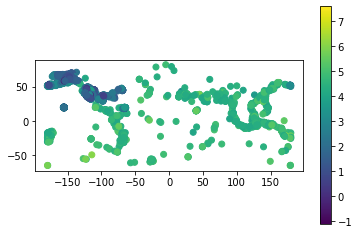

In [6]:

gdf.plot("properties.mag", legend=True) 

# Pretty pictures time!
> 1. First one is just placing points on a graph based on longitude and latitude
> 2. Second does same put combines it with an interactive map 

The graph above is an interactive map so may be some issues displaying them in a PDF initialling. If you save it as a HTML file it is there.

In [7]:
gdf.explore("properties.mag", legend=True) 